--------
# **Libraries**

In [214]:
# Image Processing
from PIL import Image

# Computation & Main
import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import torchvision.transforms as transforms

# Data Visualization
import matplotlib.pyplot as plt
import pandas as pd
import matplotlib.image as mpimg

# Data Split
from torch.utils.data import Dataset, DataLoader
from sklearn.model_selection import train_test_split

# Miscs
import os
import random as rand
import timm

In [215]:
torch.cuda.empty_cache()

In [216]:
# Set Device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [217]:
def set_seed(seed):
  rand.seed(seed)
  np.random.seed(seed)
  torch.cuda.manual_seed(seed)
  torch.cuda.manual_seed_all(seed)
  torch.backends.cudnn.deterministic = True
  torch.backends.cudnn.benchmark = False

seed = 59
set_seed(59)

--------
# **Test**

In [218]:
img_size = 512

img_trans_test = transforms.Compose(
    [
        transforms.Resize((img_size, img_size)),
        transforms.ToTensor(),
    ]
)

In [219]:
def load_img_test(root):
    img = Image.open(root)
    img = img_trans_test(img).unsqueeze(0) # Add batch_size | batch_size, Channel, Height, Width
    return img.to(device, torch.float)

test_img = load_img_test('/kaggle/input/sample-data/content_img.jpg')
print(f"Shape of test_img: {test_img.shape}")
print(test_img[0])

Shape of test_img: torch.Size([1, 3, 512, 512])
tensor([[[0.6314, 0.5843, 0.5882,  ..., 0.0941, 0.0902, 0.1020],
         [0.6196, 0.5843, 0.5882,  ..., 0.0941, 0.1059, 0.1020],
         [0.6353, 0.6118, 0.6157,  ..., 0.0902, 0.0980, 0.0941],
         ...,
         [0.0157, 0.0157, 0.0157,  ..., 0.0588, 0.0627, 0.0588],
         [0.0157, 0.0157, 0.0196,  ..., 0.0353, 0.0392, 0.0392],
         [0.0157, 0.0235, 0.0196,  ..., 0.0314, 0.0275, 0.0275]],

        [[0.6118, 0.5647, 0.5686,  ..., 0.0902, 0.0824, 0.0941],
         [0.6000, 0.5647, 0.5686,  ..., 0.0902, 0.0980, 0.0941],
         [0.6157, 0.5922, 0.5882,  ..., 0.0824, 0.0863, 0.0863],
         ...,
         [0.0078, 0.0078, 0.0157,  ..., 0.0627, 0.0667, 0.0588],
         [0.0078, 0.0078, 0.0157,  ..., 0.0392, 0.0431, 0.0431],
         [0.0039, 0.0078, 0.0118,  ..., 0.0353, 0.0314, 0.0314]],

        [[0.5922, 0.5490, 0.5569,  ..., 0.1020, 0.0902, 0.1020],
         [0.5765, 0.5490, 0.5529,  ..., 0.0941, 0.1098, 0.1020],
         [

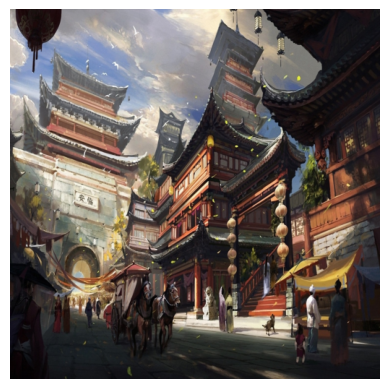

In [220]:
def show_tensor_img(tensor_img):
    # Move to CPU and remove batch dimension
    img = tensor_img.squeeze(0).cpu().numpy()  # Shape: (C, H, W)

    # Rearrange channels from (C, H, W) to (H, W, C)
    img = np.transpose(img, (1, 2, 0))

    # Clamp values to be between 0 and 1 if necessary
    img = np.clip(img, 0, 1)

    # Display the image
    plt.imshow(img)
    plt.axis("off")  # Hide axes
    plt.show()

# Call the function
show_tensor_img(test_img)

In [221]:
lst = [1, 2, 3, 4]
print(lst[0:3])
# (Start, End - 1)

print(test_img[0][0][0].shape)
print(type(test_img[0][0][0]))

[1, 2, 3]
torch.Size([512])
<class 'torch.Tensor'>


-------------
# **Split Image**

In [222]:
# Get the height and width dimensions
square_size = 128
height = test_img.shape[2]  # Height dimension (index 2)
width = test_img.shape[3]   # Width dimension (index 3)

# Calculate the number of rows and columns
num_rows = height // square_size
num_cols = width // square_size

img_log = {}

# Iterate through the grid of patches
for row in range(1, num_rows + 1):
    for column in range(1, num_cols + 1):
        # Extract the patch
        patch = test_img[:, :, 
                        (row - 1)*square_size:row*square_size, 
                        (column - 1)*square_size:column*square_size]
        
        # Store the patch in img_log (assuming you want to index them)
        patch_idx = (row - 1) * num_cols + column
        img_log[row, column] = patch

In [223]:
img_log

{(1,
  1): tensor([[[[0.6314, 0.5843, 0.5882,  ..., 0.5922, 0.5922, 0.5843],
           [0.6196, 0.5843, 0.5882,  ..., 0.5922, 0.6000, 0.5843],
           [0.6353, 0.6118, 0.6157,  ..., 0.5882, 0.5922, 0.5843],
           ...,
           [0.7451, 0.7529, 0.7686,  ..., 0.5373, 0.5529, 0.5608],
           [0.7451, 0.7608, 0.7647,  ..., 0.5529, 0.5961, 0.6275],
           [0.7490, 0.7569, 0.7569,  ..., 0.5529, 0.6196, 0.6667]],
 
          [[0.6118, 0.5647, 0.5686,  ..., 0.5804, 0.5843, 0.5804],
           [0.6000, 0.5647, 0.5686,  ..., 0.5804, 0.5882, 0.5804],
           [0.6157, 0.5922, 0.5882,  ..., 0.5765, 0.5804, 0.5765],
           ...,
           [0.7098, 0.7059, 0.7255,  ..., 0.3765, 0.3922, 0.4275],
           [0.7098, 0.7176, 0.7294,  ..., 0.3647, 0.4078, 0.4549],
           [0.7098, 0.7137, 0.7255,  ..., 0.3647, 0.4235, 0.4745]],
 
          [[0.5922, 0.5490, 0.5569,  ..., 0.6078, 0.6078, 0.6000],
           [0.5765, 0.5490, 0.5529,  ..., 0.6078, 0.6157, 0.6039],
           [0.

Shape of Patch (1, 1): torch.Size([1, 3, 128, 128])
-----------------------------------------------------------


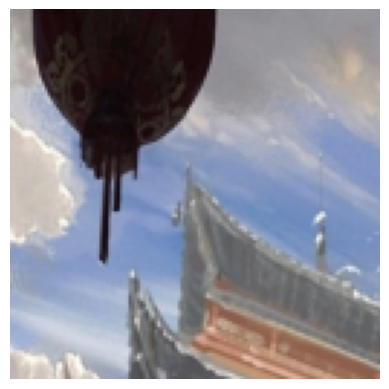

Shape of Patch (1, 2): torch.Size([1, 3, 128, 128])
-----------------------------------------------------------


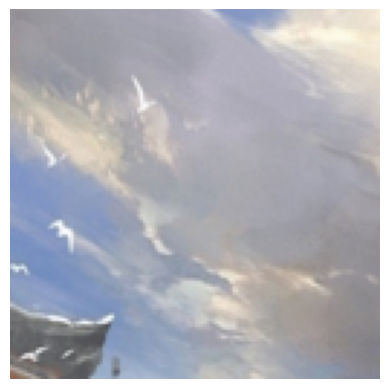

Shape of Patch (1, 3): torch.Size([1, 3, 128, 128])
-----------------------------------------------------------


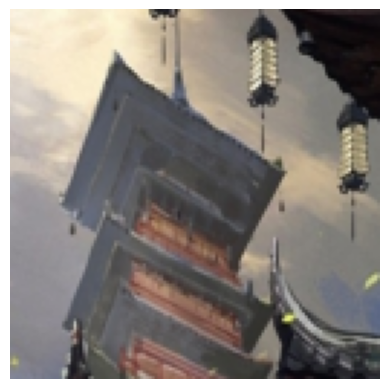

Shape of Patch (1, 4): torch.Size([1, 3, 128, 128])
-----------------------------------------------------------


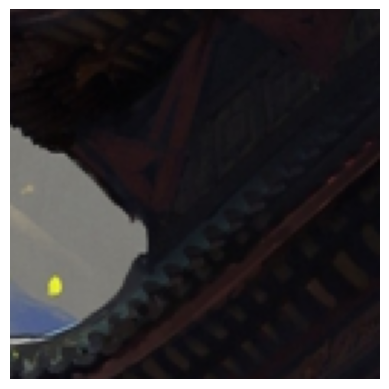

Shape of Patch (2, 1): torch.Size([1, 3, 128, 128])
-----------------------------------------------------------


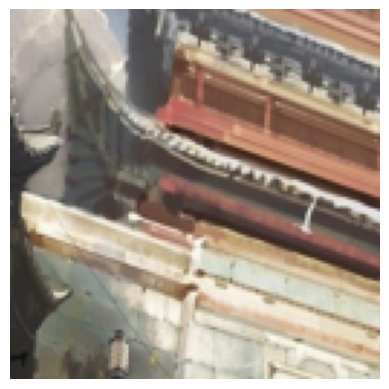

Shape of Patch (2, 2): torch.Size([1, 3, 128, 128])
-----------------------------------------------------------


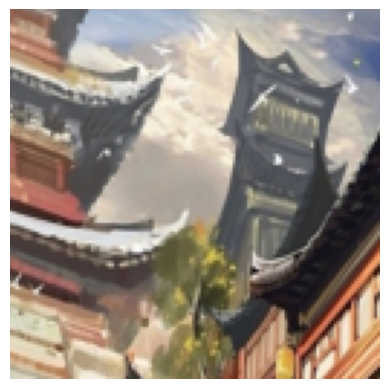

Shape of Patch (2, 3): torch.Size([1, 3, 128, 128])
-----------------------------------------------------------


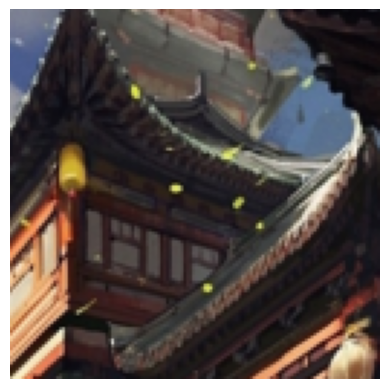

Shape of Patch (2, 4): torch.Size([1, 3, 128, 128])
-----------------------------------------------------------


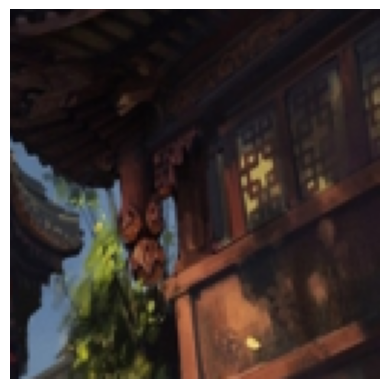

Shape of Patch (3, 1): torch.Size([1, 3, 128, 128])
-----------------------------------------------------------


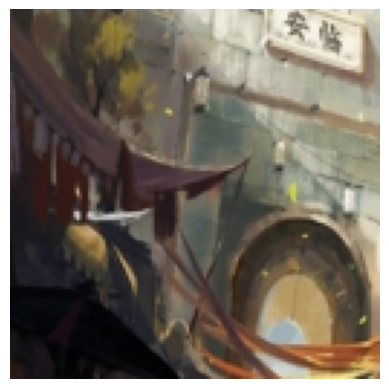

Shape of Patch (3, 2): torch.Size([1, 3, 128, 128])
-----------------------------------------------------------


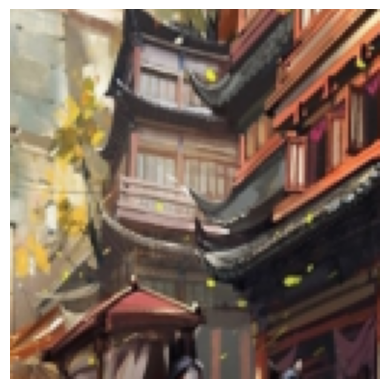

Shape of Patch (3, 3): torch.Size([1, 3, 128, 128])
-----------------------------------------------------------


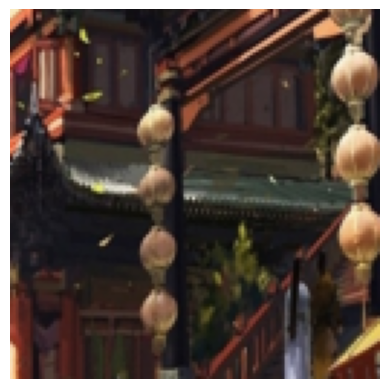

Shape of Patch (3, 4): torch.Size([1, 3, 128, 128])
-----------------------------------------------------------


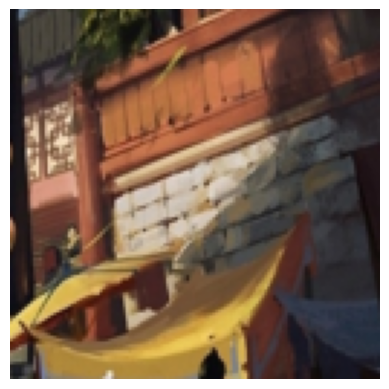

Shape of Patch (4, 1): torch.Size([1, 3, 128, 128])
-----------------------------------------------------------


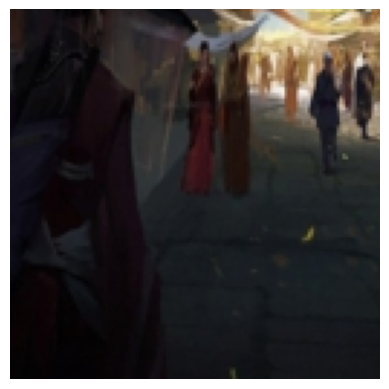

Shape of Patch (4, 2): torch.Size([1, 3, 128, 128])
-----------------------------------------------------------


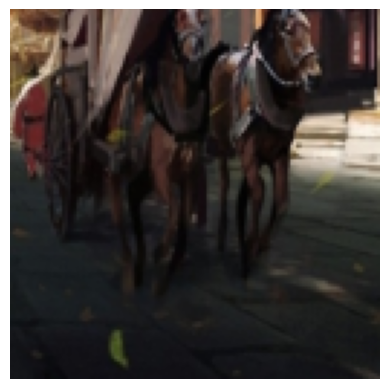

Shape of Patch (4, 3): torch.Size([1, 3, 128, 128])
-----------------------------------------------------------


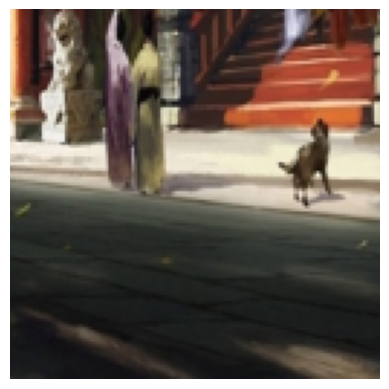

Shape of Patch (4, 4): torch.Size([1, 3, 128, 128])
-----------------------------------------------------------


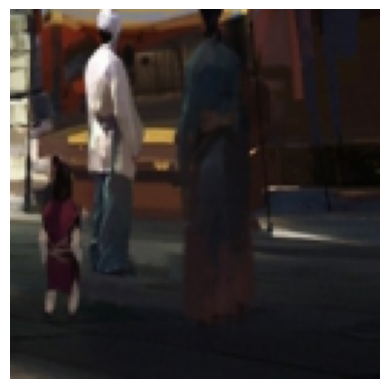

In [224]:
# Test if Patching Works
for key in img_log:
    print(f"Shape of Patch {key}: {img_log[key].shape}")
    print("-"*59)
    show_tensor_img(img_log[key])

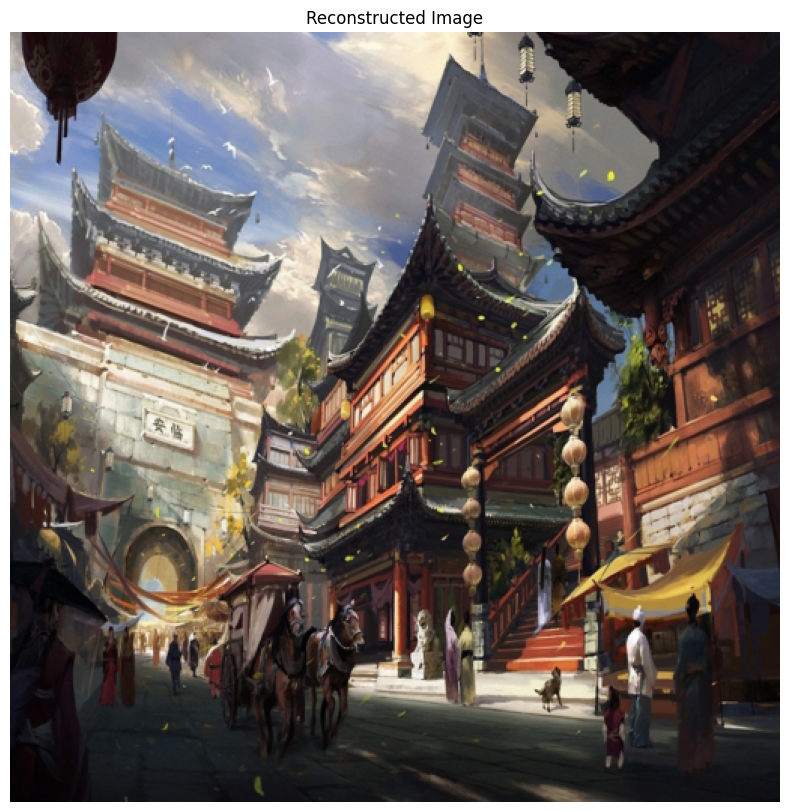

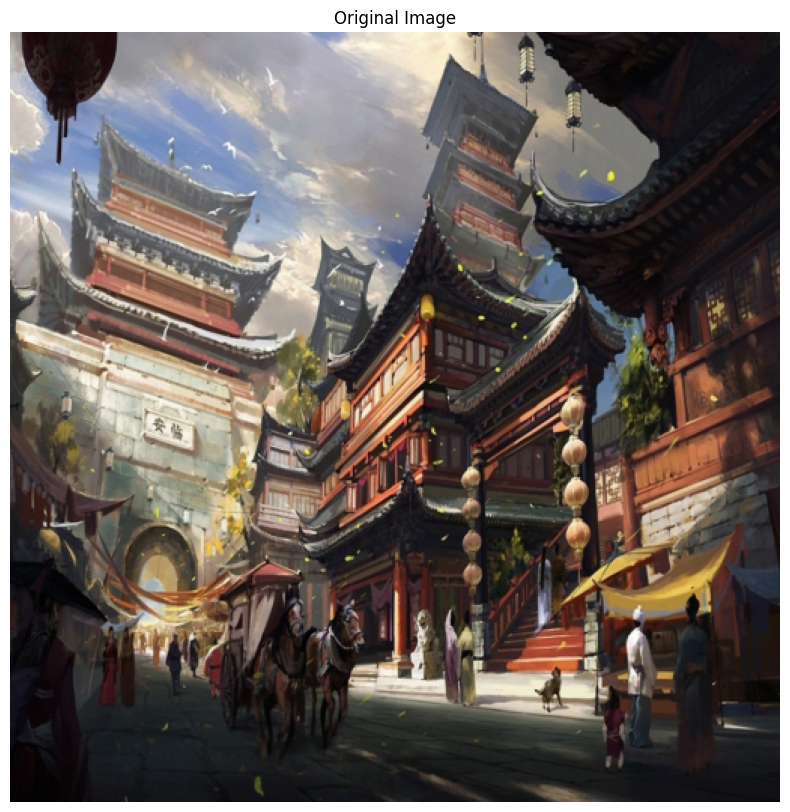

Difference between original and reconstructed: 0.0
Successfully reconstructed the original image!


In [225]:
# Determine the grid dimensions
patch_size = 128
grid_size = 4  # 512 ÷ 128 = 4

# Create empty tensor for the reconstructed image
channels = img_log[(1, 1)].shape[1]
reconstructed = torch.zeros(1, channels, 512, 512, device=img_log[(1, 1)].device)

# Place each patch in its correct position
for row in range(1, grid_size + 1):
    for col in range(1, grid_size + 1):
        
        # Get the patch
        patch = img_log[row, col]
        
        # Calculate position in the reconstructed image
        row_start = (row - 1) * patch_size
        row_end = row * patch_size
        col_start = (col - 1) * patch_size
        col_end = col * patch_size
        
        # Place the patch
        reconstructed[:, :, row_start:row_end, col_start:col_end] = patch

# Visualize the reconstructed image
plt.figure(figsize=(10, 10))
if reconstructed.shape[1] == 3:  # RGB image
    # Convert from [B,C,H,W] to [H,W,C] for matplotlib
    img_np = reconstructed[0].permute(1, 2, 0).cpu().detach().numpy()
    plt.imshow(img_np)
else:  # Grayscale image
    img_np = reconstructed[0, 0].cpu().detach().numpy()
    plt.imshow(img_np, cmap='gray')
plt.title("Reconstructed Image")
plt.axis('off')
plt.show()

# Visualize the original image
plt.figure(figsize=(10, 10))
if test_img.shape[1] == 3:  # RGB image
    # Convert from [B,C,H,W] to [H,W,C] for matplotlib
    original_img_np = test_img[0].permute(1, 2, 0).cpu().detach().numpy()
    plt.imshow(original_img_np)
else:  # Grayscale image
    original_img_np = test_img[0, 0].cpu().detach().numpy()
    plt.imshow(original_img_np, cmap='gray')
plt.title("Original Image")
plt.axis('off')
plt.show()

# Verify it matches the original
if 'test_img' in globals():
    # Calculate difference between original and reconstructed
    diff = torch.abs(test_img - reconstructed).sum().item()
    print(f"Difference between original and reconstructed: {diff}")
    if diff < 1e-5:
        print("Successfully reconstructed the original image!")
    else:
        print("Reconstruction differs from the original image.")

---------
# **Grafting**

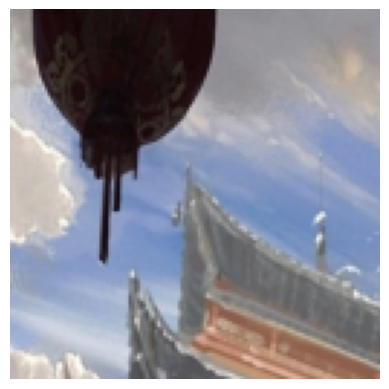

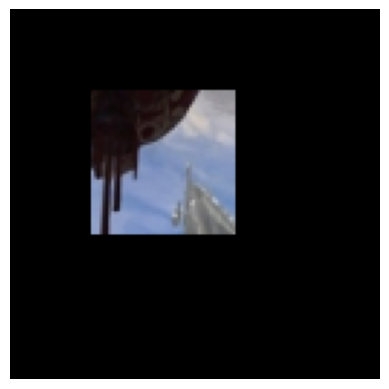

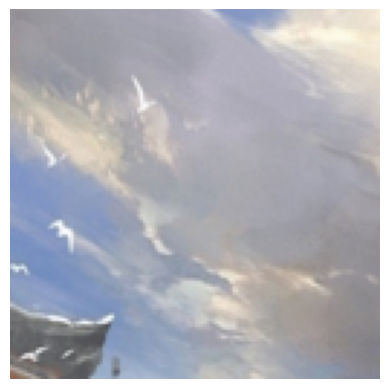

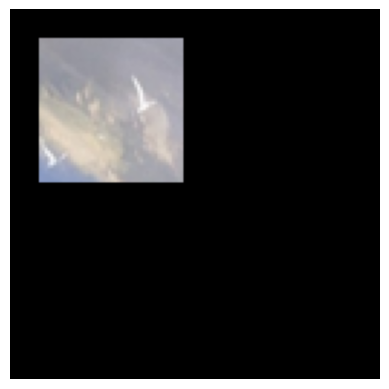

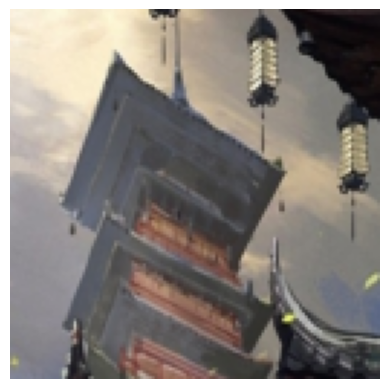

...

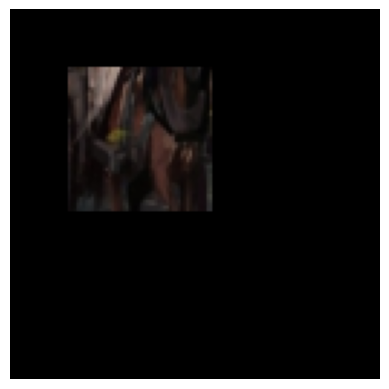

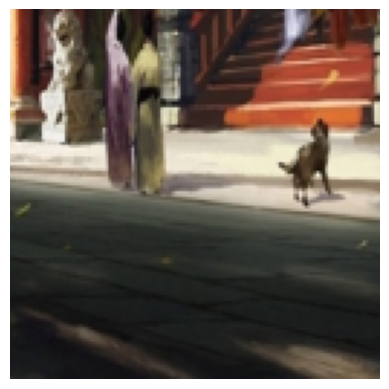

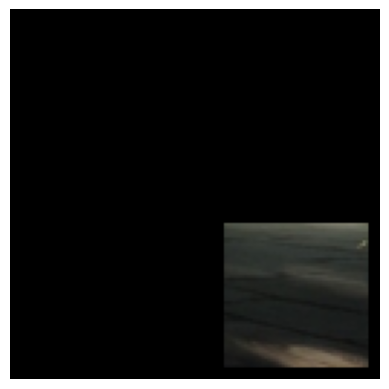

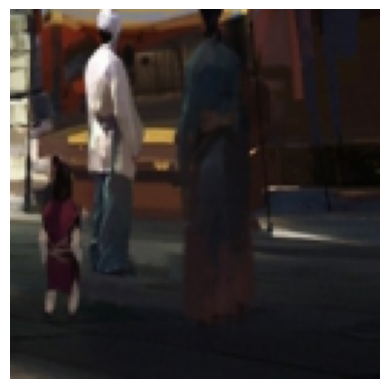

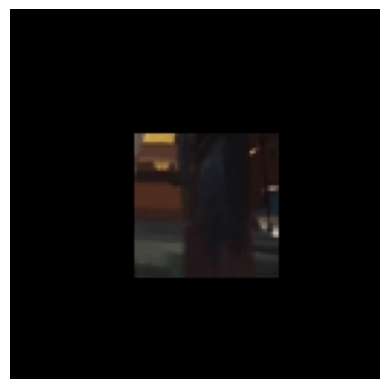

In [226]:
graft_patch = {}
# Grafting
for key in img_log:
    channels = 3
    grafted_patch = torch.zeros(1, channels, 128, 128, device=img_log[key].device)
    patch = img_log[key]
    show_tensor_img(patch)

    # Initialize a Random Kernel to take a Random Spot (Kernel shouldn't be as big as patch)
    # Hard-Code Kernel Size for easier Interpretation
    hard_code_kernel_size = 50 # (50, 50) in a (128, 128) patch
    rand_spot = rand.randint(0, 128-hard_code_kernel_size) # Inclusive 

    # Take Random Patch
    rand_patch = patch[:, :, rand_spot:rand_spot + hard_code_kernel_size, rand_spot:rand_spot + hard_code_kernel_size]

    # Map to grafted_patch
    grafted_patch[:, :, rand_spot:rand_spot + hard_code_kernel_size, rand_spot:rand_spot + hard_code_kernel_size] = rand_patch

    # Log
    graft_patch[key] = grafted_patch
    show_tensor_img(grafted_patch)

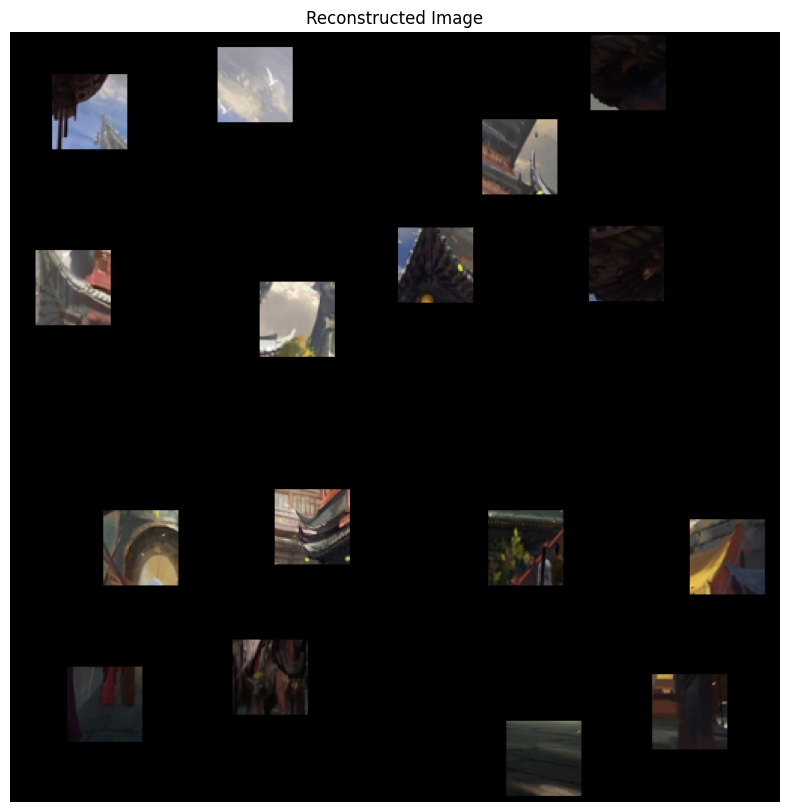

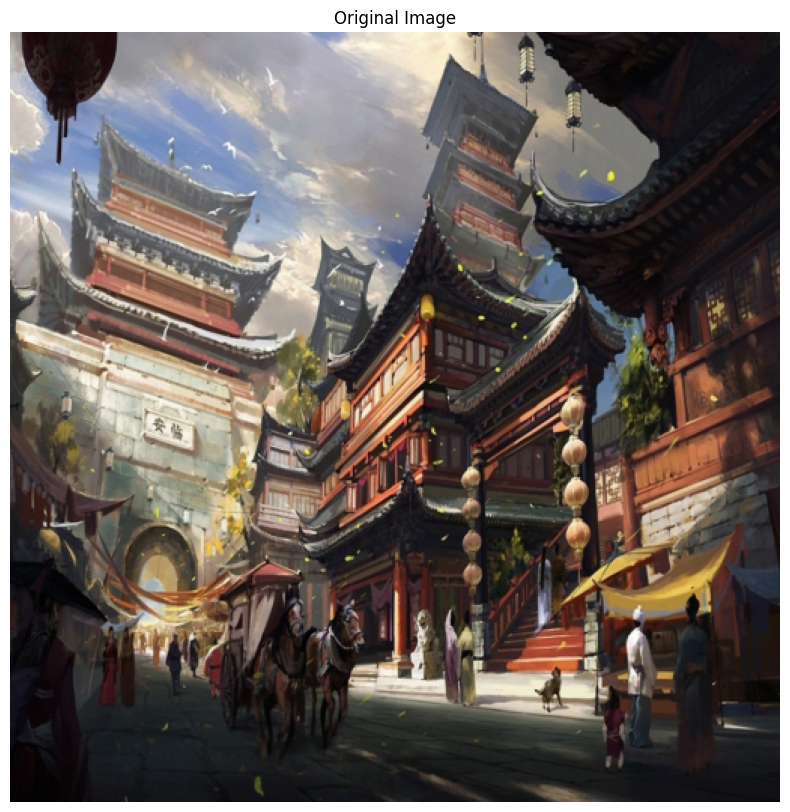

In [230]:
# Determine the grid dimensions
patch_size = 128
grid_size = 4  # 512 ÷ 128 = 4

# Create empty tensor for the reconstructed image
channels = img_log[(1, 1)].shape[1]
reconstructed_graft = torch.zeros(1, channels, 512, 512, device=img_log[(1, 1)].device)

# Place each patch in its correct position
for row in range(1, grid_size + 1):
    for col in range(1, grid_size + 1):
        
        # Get the patch
        patch = graft_patch[row, col]
        
        # Calculate position in the reconstructed image
        row_start = (row - 1) * patch_size
        row_end = row * patch_size
        col_start = (col - 1) * patch_size
        col_end = col * patch_size
        
        # Place the patch
        reconstructed_graft[:, :, row_start:row_end, col_start:col_end] = patch

# Visualize the reconstructed image
plt.figure(figsize=(10, 10))
if reconstructed_graft.shape[1] == 3:  # RGB image
    # Convert from [B,C,H,W] to [H,W,C] for matplotlib
    img_np = reconstructed_graft[0].permute(1, 2, 0).cpu().detach().numpy()
    plt.imshow(img_np)
else:  # Grayscale image
    img_np = reconstructed_graft[0, 0].cpu().detach().numpy()
    plt.imshow(img_np, cmap='gray')
plt.title("Reconstructed Image")
plt.axis('off')
plt.show()

# Visualize the original image
plt.figure(figsize=(10, 10))
if test_img.shape[1] == 3:  # RGB image
    # Convert from [B,C,H,W] to [H,W,C] for matplotlib
    original_img_np = test_img[0].permute(1, 2, 0).cpu().detach().numpy()
    plt.imshow(original_img_np)
else:  # Grayscale image
    original_img_np = test_img[0, 0].cpu().detach().numpy()
    plt.imshow(original_img_np, cmap='gray')
plt.title("Original Image")
plt.axis('off')
plt.show()

------------
# ** Conway's Game of Life**

In [231]:
"""

    Should we compute Conway's Game of Life
    on each Patch
    or on the whole Image?
    (It would OBVIOUSLY be REALLY different if the field
    is larger)
    
"""

"\n\n    Should we compute Conway's Game of Life\n    on each Patch\n    or on the whole Image?\n\n"